In [25]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale,maxabs_scale
import seaborn as sns



In [2]:
colname= ['nose_x', 'nose_y' , 'l_eye_x', 'l_eye_y', 'r_eye_x', 'r_eye_y', 'l_ear_x', 'l_ear_y', 'r_ear_x', 'r_ear_y', 'l_shoulder_x', 'l_shoulder_y', 'r_shoulder_x', 'r_shoulder_y', 'l_elbow_x', 'l_elbow_y', 'r_elbow_x', 'r_elbow_y', 'l_wrist_x', 'l_wrist_y', 'r_wrist_x', 'r_wrist_y', 'l_hip_x', 'l_hip_y', 'r_hip_x', 'r_hip_y', 'l_knee_x', 'l_knee_y', 'r_knee_x', 'r_knee_y', 'l_ankle_x', 'l_ankle_y', 'r_ankle_x', 'r_ankle_y']

In [3]:
#function to scale the data
def scale(df):
    df_d = df[['l_nose_xy','l_eye_xy','r_eye_xy','l_ear_xy','r_ear_xy','l_shoulder_xy','r_shoulder_xy','l_elbow_xy','r_elbow_xy','l_wrist_xy','r_wrist_xy','l_hip_xy','r_hip_xy','l_knee_xy','r_knee_xy','l_ankle_xy','r_ankle_xy']]
    df_a = df[['l_shoulder_a','r_shoulder_a','l_elbow_a','r_elbow_a','l_wrist_a','r_wrist_a','l_hip_a','r_hip_a','l_knee_a','r_knee_a','l_ankle_a','r_ankle_a','l_nose_a','l_ear_a','r_ear_a','l_eye_a','r_eye_a']]
    min = df_d.min().min()    # df['Low'].min()
    max = df_d.max().max()    # df['High'].max()  
    df_d = (df_d - min) / (max - min)      
    return  pd.concat([df_d, df_a], axis=1)


In [100]:
#function to calculate euclidean distance   
def calc_euc_dist(df1,df2,filename):
                
                df1['l_nose_xy'] = np.sqrt( df1['nose_x'] + df1['nose_y'] )
                df1['l_eye_xy'] = np.sqrt( df1['l_eye_x'] + df1['l_eye_y'] )
                df1['r_eye_xy'] = np.sqrt( df1['r_eye_x'] + df1['r_eye_y'] )
                df1['l_ear_xy'] = np.sqrt( df1['l_ear_x'] + df1['l_ear_y'] )
                df1['r_ear_xy'] = np.sqrt( df1['r_ear_x'] + df1['r_ear_y'] )
                df1['l_shoulder_xy'] =   np.sqrt( df1['l_shoulder_x'] + df1['l_shoulder_y'] )
                df1['r_shoulder_xy'] =   np.sqrt( df1['r_shoulder_x'] + df1['r_shoulder_y'] )
                df1['l_elbow_xy'] =   np.sqrt( df1['l_elbow_x'] + df1['l_elbow_y'] )
                df1['r_elbow_xy'] =   np.sqrt( df1['r_elbow_x'] + df1['r_elbow_y'] )
                df1['l_wrist_xy'] =   np.sqrt( df1['l_wrist_x'] + df1['l_wrist_y'] )
                df1['r_wrist_xy'] =   np.sqrt( df1['r_wrist_x'] + df1['r_wrist_y'] )
                df1['l_hip_xy'] =   np.sqrt( df1['l_hip_x'] + df1['l_hip_y'] )
                df1['r_hip_xy'] =   np.sqrt( df1['r_hip_x'] + df1['r_hip_y'] )
                df1['l_knee_xy'] =   np.sqrt( df1['l_knee_x'] + df1['l_knee_y'] )
                df1['r_knee_xy'] =   np.sqrt( df1['r_knee_x'] + df1['r_knee_y'] )
                df1['l_ankle_xy'] =   np.sqrt( df1['l_ankle_x'] + df1['l_ankle_y'] )
                df1['r_ankle_xy'] =   np.sqrt( df1['r_ankle_x'] + df1['r_ankle_y'] )
                df1['l_nose_a'] = np.tan( df2['nose_y']/df2['nose_x'] )
                df1['l_eye_a'] = np.tan( df2['l_eye_y']/df2['l_eye_x'] )
                df1['r_eye_a'] = np.tan( df2['r_eye_y']/df2['r_eye_x'] )
                df1['l_ear_a'] = np.tan( df2['l_ear_y']/df2['l_ear_x'] )
                df1['r_ear_a'] = np.tan( df2['r_ear_y']/df2['r_ear_x'] )
                df1['l_shoulder_a'] =  np.tan( df2['l_shoulder_y']/df2['l_shoulder_x'] )
                df1['r_shoulder_a'] = np.tan( df2['r_shoulder_y']/df2['r_shoulder_x'] )
                df1['l_elbow_a'] = np.tan( df2['l_elbow_y']/df2['l_elbow_x'] )
                df1['r_elbow_a'] = np.tan( df2['r_elbow_y']/df2['r_elbow_x'] )
                df1['l_wrist_a'] = np.tan( df2['l_wrist_y']/df2['l_wrist_x'] )
                df1['r_wrist_a'] = np.tan( df2['r_wrist_y']/df2['r_wrist_x'] )
                df1['l_hip_a'] = np.tan( df2['l_hip_y']/df2['l_hip_x'] )
                df1['r_hip_a'] = np.tan( df2['r_hip_y']/df2['r_hip_x'] )
                df1['l_knee_a'] = np.tan( df2['l_knee_y']/df2['l_knee_x'] )
                df1['r_knee_a'] = np.tan( df2['r_knee_y']/df2['r_knee_x'] )
                df1['l_ankle_a'] = np.tan( df2['l_ankle_y']/df2['l_ankle_x'] )
                df1['r_ankle_a'] = np.tan( df2['r_ankle_y']/df2['r_ankle_x'] )
                #for x in df1.columns:
                #    df1[x] = minmax_scale(df1[x])
                df1 =scale(df1)
                df1['filename'] = filename
                return df1[['l_nose_xy','l_eye_xy','r_eye_xy','l_ear_xy','r_ear_xy','l_shoulder_xy','r_shoulder_xy','l_elbow_xy','r_elbow_xy','l_wrist_xy','r_wrist_xy','l_hip_xy','r_hip_xy','l_knee_xy','r_knee_xy','l_ankle_xy','r_ankle_xy','l_shoulder_a','r_shoulder_a','l_elbow_a','r_elbow_a','l_wrist_a','r_wrist_a','l_hip_a','r_hip_a','l_knee_a','r_knee_a','l_ankle_a','r_ankle_a','l_nose_a','l_ear_a','r_ear_a','l_eye_a','r_eye_a']]
                

## Walk thru  all directories in the dataset and combine data to one Pandas Dataframe . apply euclidenan distance and angle 

In [101]:
X=pd.DataFrame()
for root, dirs, files in os.walk('../Data/Detectron/'):
        for name in files:
                if(name.endswith('.csv') == False):
                    continue
                filepath = root + os.sep + name
                df = pd.read_csv(filepath,names=colname,header=None)
                df1 = df[::5].diff().pow(2)
                df2 = df[::5].diff()
                df1 = calc_euc_dist(df1,df2,"")
                df1.dropna(inplace=True)
                df1['filename'] = name  
                df1['workout'] = root.split('/')[-1]
                X=pd.concat([X,df1])

In [103]:
#Check for duplicates
duplicate_count = X.duplicated().sum()
duplicate_count

0

## Missing values 
Next create a pandas dataframe to hold the missing value summary 

In [104]:
X.isnull().sum()
na_cols=X.columns[X.isna().any()].tolist()
 # Missing values summary
mv=pd.DataFrame(X[na_cols].isna().sum(), columns=['Number_missing'])
desc = pd.DataFrame(index = list(X))
desc['count'] = X.count()
desc['nunique'] = X.nunique()
desc['%unique'] = desc['nunique'] / len(X) * 100
desc['null'] = X.isnull().sum()
desc['Percentage_missing']=np.round(100*mv['Number_missing']/len(X),2)
desc['type'] = X.dtypes
desc = pd.concat([desc, X.describe().T.drop('count', axis = 1)], axis = 1)
desc

,count,nunique,%unique,null,Percentage_missing,type,mean,std,min,25%,50%,75%,max
l_nose_xy,2660,2651,99.661654,0,NaN,float64,0.118975,0.180590,0.000000,0.012351,0.039952,0.150607,1.000000
l_eye_xy,2660,2656,99.849624,0,NaN,float64,0.119751,0.179661,0.000000,0.012722,0.042922,0.151924,1.000000
r_eye_xy,2660,2651,99.661654,0,NaN,float64,0.122395,0.184847,0.000000,0.011967,0.041287,0.158700,1.000000
l_ear_xy,2660,2655,99.812030,0,NaN,float64,0.123101,0.187985,0.000000,0.011924,0.042227,0.145872,1.000000
r_ear_xy,2660,2653,99.736842,0,NaN,float64,0.124214,0.188489,0.000000,0.012557,0.040765,0.153240,1.000000
l_shoulder_xy,2660,2653,99.736842,0,NaN,float64,0.102757,0.157149,0.000000,0.014387,0.043248,0.114740,1.000000
r_shoulder_xy,2660,2657,99.887218,0,NaN,float64,0.103732,0.155699,0.000000,0.014869,0.041315,0.117879,0.992869
l_elbow_xy,2660,2650,99.624060,0,NaN,float64,0.129216,0.197294,0.000000,0.015507,0.048002,0.146674,1.000000
r_elbow_xy,2660,2650,99.624060,0,NaN,float64,0.144743,0.209527,0.000000,0.018080,0.055180,0.167111,1.000000
l_wrist_xy,2660,2647,99.511278,0,NaN,float64,0.147396,0.223952,0.000000,0.009961,0.040565,0.183708,1.000000


## EDA Exploratary Data Analysis 


Check for correlation of numerical columns

In [105]:
X.select_dtypes('number').corr()

,l_nose_xy,l_eye_xy,r_eye_xy,l_ear_xy,r_ear_xy,l_shoulder_xy,r_shoulder_xy,l_elbow_xy,r_elbow_xy,l_wrist_xy,...,r_hip_a,l_knee_a,r_knee_a,l_ankle_a,r_ankle_a,l_nose_a,l_ear_a,r_ear_a,l_eye_a,r_eye_a
l_nose_xy,1.000000,0.916108,0.913816,0.803111,0.840196,0.802075,0.815982,0.577391,0.531331,0.405458,...,-0.003880,0.004006,0.027482,0.015965,0.019625,0.002125,0.024178,-0.023947,0.030430,-0.009945
l_eye_xy,0.916108,1.000000,0.915275,0.826346,0.861225,0.813070,0.811491,0.585107,0.532036,0.423170,...,-0.009333,0.003565,0.029226,0.016847,0.022483,0.000363,0.024658,-0.022986,0.034839,-0.013822
r_eye_xy,0.913816,0.915275,1.000000,0.792299,0.838760,0.787796,0.800635,0.560045,0.497267,0.388707,...,-0.006600,0.002948,0.026093,0.016814,0.018124,0.000380,0.018464,-0.017529,0.029934,-0.021124
l_ear_xy,0.803111,0.826346,0.792299,1.000000,0.811257,0.766876,0.771571,0.565737,0.514367,0.400313,...,-0.006918,0.025592,0.028473,0.017644,0.023920,-0.004076,0.016929,-0.021676,0.010849,-0.015841
r_ear_xy,0.840196,0.861225,0.838760,0.811257,1.000000,0.795065,0.797388,0.559058,0.505173,0.396236,...,-0.005958,0.005338,0.023968,0.017705,0.022270,0.005097,0.024495,-0.020634,0.013497,-0.014073
l_shoulder_xy,0.802075,0.813070,0.787796,0.766876,0.795065,1.000000,0.820954,0.673140,0.571260,0.489612,...,-0.008195,0.006842,0.030403,0.018804,0.016078,-0.000524,0.017341,-0.017061,0.008430,0.001810
r_shoulder_xy,0.815982,0.811491,0.800635,0.771571,0.797388,0.820954,1.000000,0.632668,0.615258,0.468842,...,-0.011865,0.004210,0.020932,0.021252,0.019788,0.002568,0.017237,-0.021204,0.000516,-0.008431
l_elbow_xy,0.577391,0.585107,0.560045,0.565737,0.559058,0.673140,0.632668,1.000000,0.595015,0.595677,...,-0.013173,-0.010824,0.028071,0.021720,0.018097,-0.005066,0.034014,-0.010507,0.041560,0.000355
r_elbow_xy,0.531331,0.532036,0.497267,0.514367,0.505173,0.571260,0.615258,0.595015,1.000000,0.486885,...,0.007261,0.005147,0.025850,0.017369,0.023201,-0.011031,0.005518,-0.019855,0.028075,-0.008456
l_wrist_xy,0.405458,0.423170,0.388707,0.400313,0.396236,0.489612,0.468842,0.595677,0.486885,1.000000,...,0.017280,-0.015028,0.024559,0.014643,0.015780,-0.015161,-0.017416,-0.006239,-0.008501,0.005295


Plot heatmap of correlation w.r.t numerical columns

<Axes: >

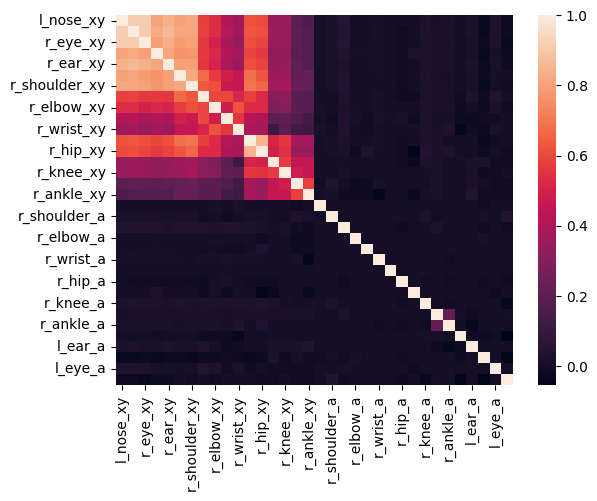

In [106]:
sns.heatmap(X.select_dtypes('number').corr())

# heatmap by workout

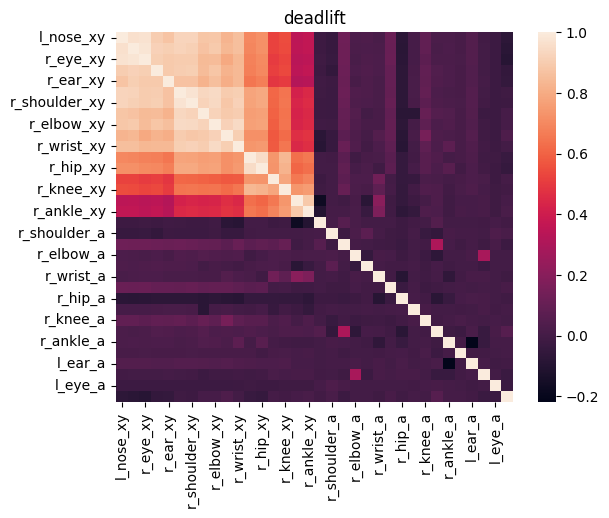

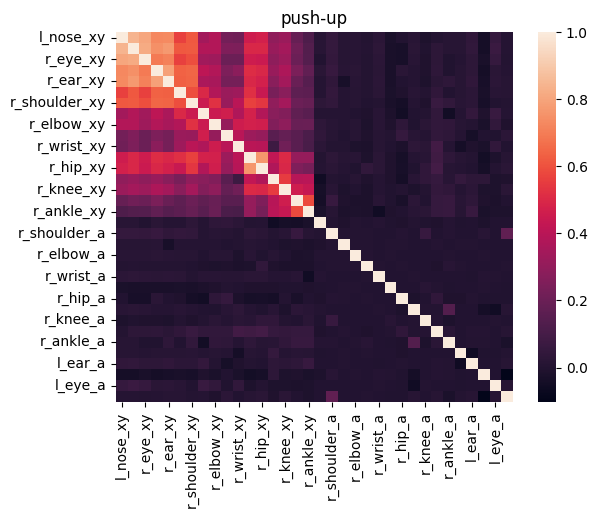

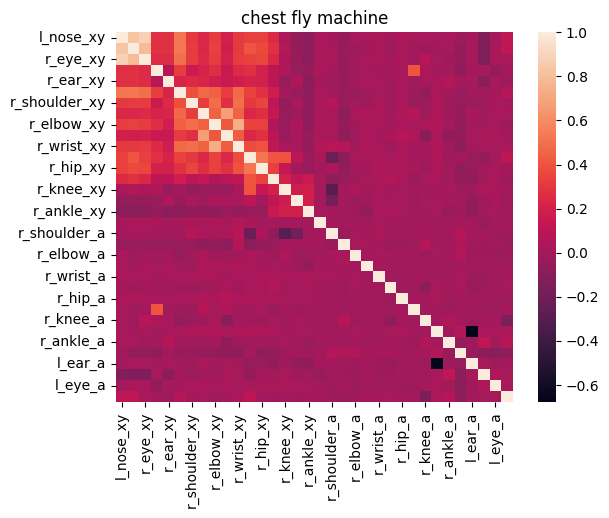

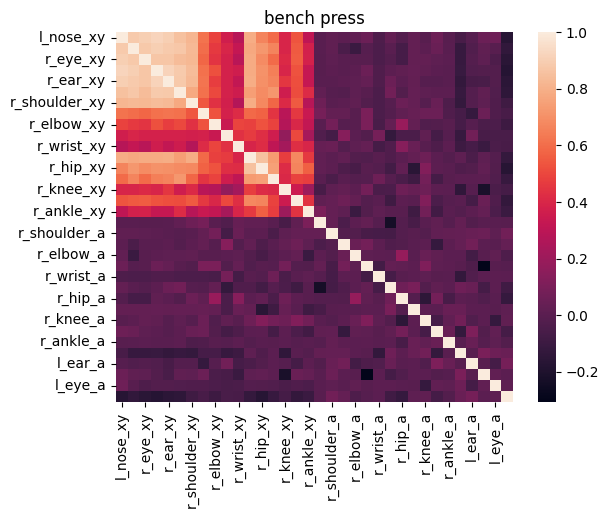

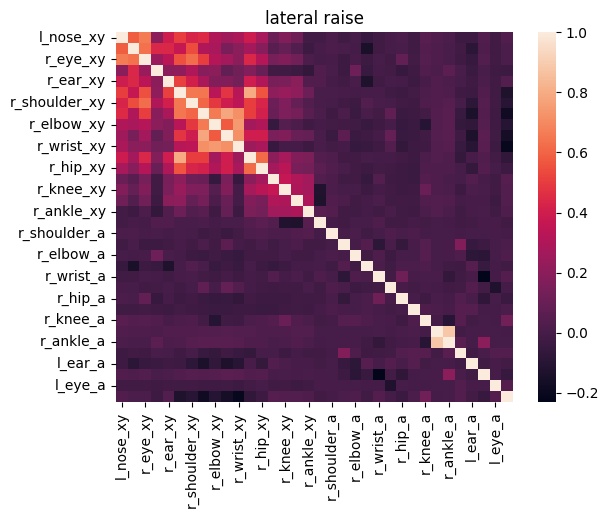

In [107]:
workouts = X['workout'].unique()
for work in workouts:
    X[X['workout'] == work].select_dtypes('number').corr()
    sns.heatmap(X[X['workout'] == work].select_dtypes('number').corr())
    plt.title(work)
    plt.show()

Look at the distribution of numerical features using distplot

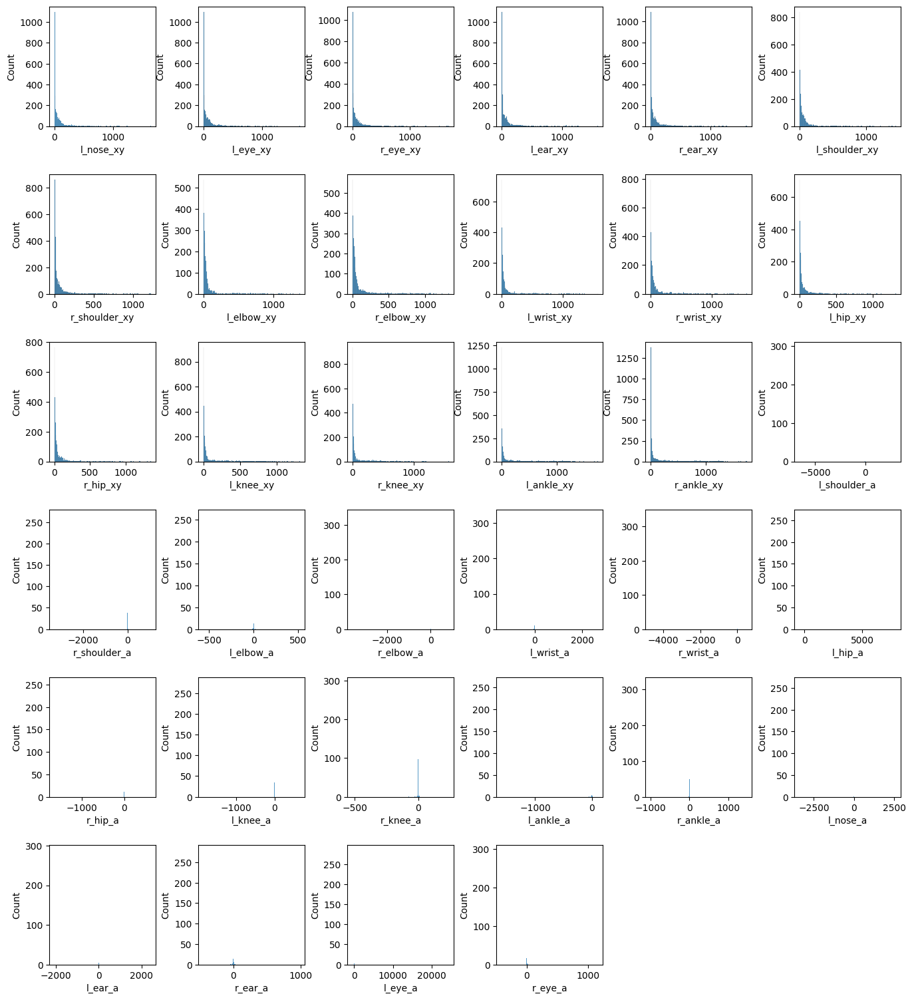

In [80]:
i=1
for x in X.select_dtypes('number').columns:
  
    plt.subplot(6,6,i)
    sns.histplot(X[x])
    plt.subplots_adjust(left=0.0,bottom=0.0,right=2.0,top=3.0,wspace=0.4,hspace=0.4)
    i = i+1


# Scatter plot of left joints

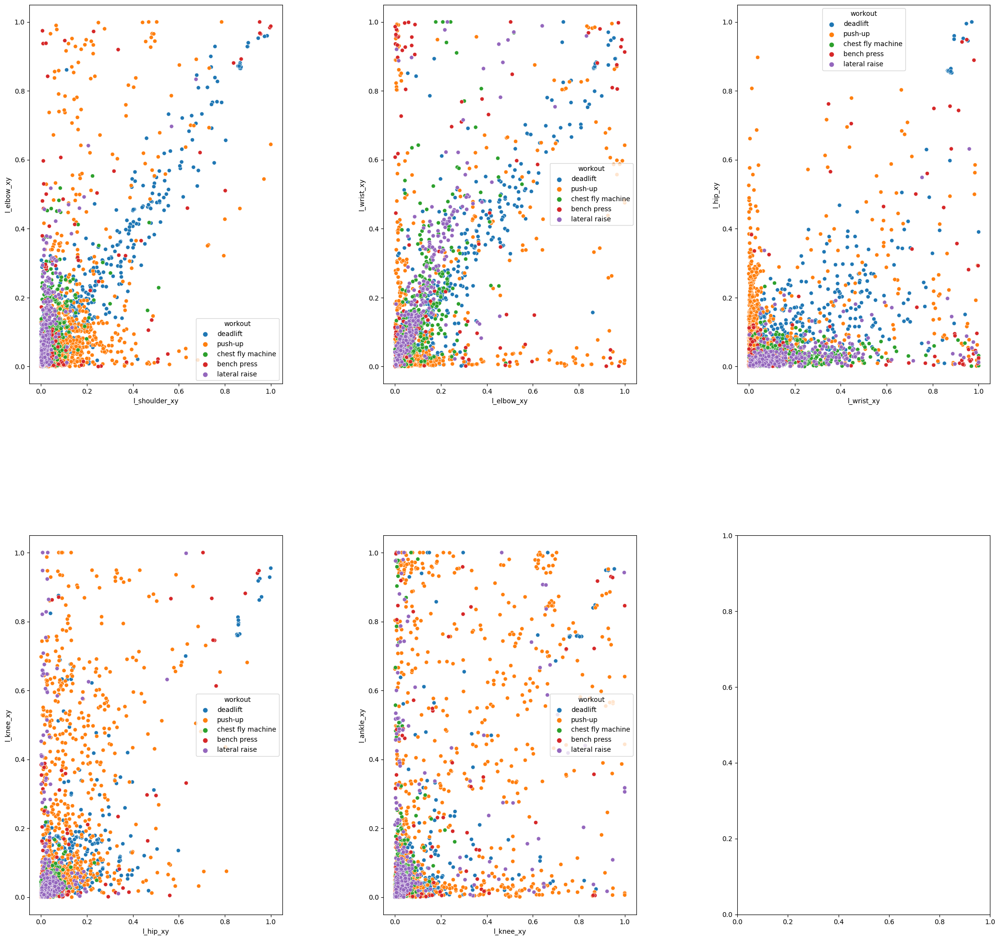

In [108]:
lcols = ['l_shoulder_xy', 'l_elbow_xy', 'l_wrist_xy', 'l_hip_xy', 'l_knee_xy', 'l_ankle_xy']
rcols = ['r_shoulder_xy',  'r_elbow_xy', 'r_wrist_xy', 'r_hip_xy', 'r_knee_xy', 'r_ankle_xy']
i=1
plt.figure(figsize=(10,10))
for idx,x in enumerate(lcols):
    plt.subplot(3,3,i)
    if(idx == len(lcols)-1):
        continue
    sns.scatterplot(x=X[x],y=X[lcols[idx+1]],hue=X['workout'])
    plt.subplots_adjust(left=0.0,bottom=0.0,right=2.0,top=3.0,wspace=0.4,hspace=0.4)
    i = i+1


# Scatter plot of right joints

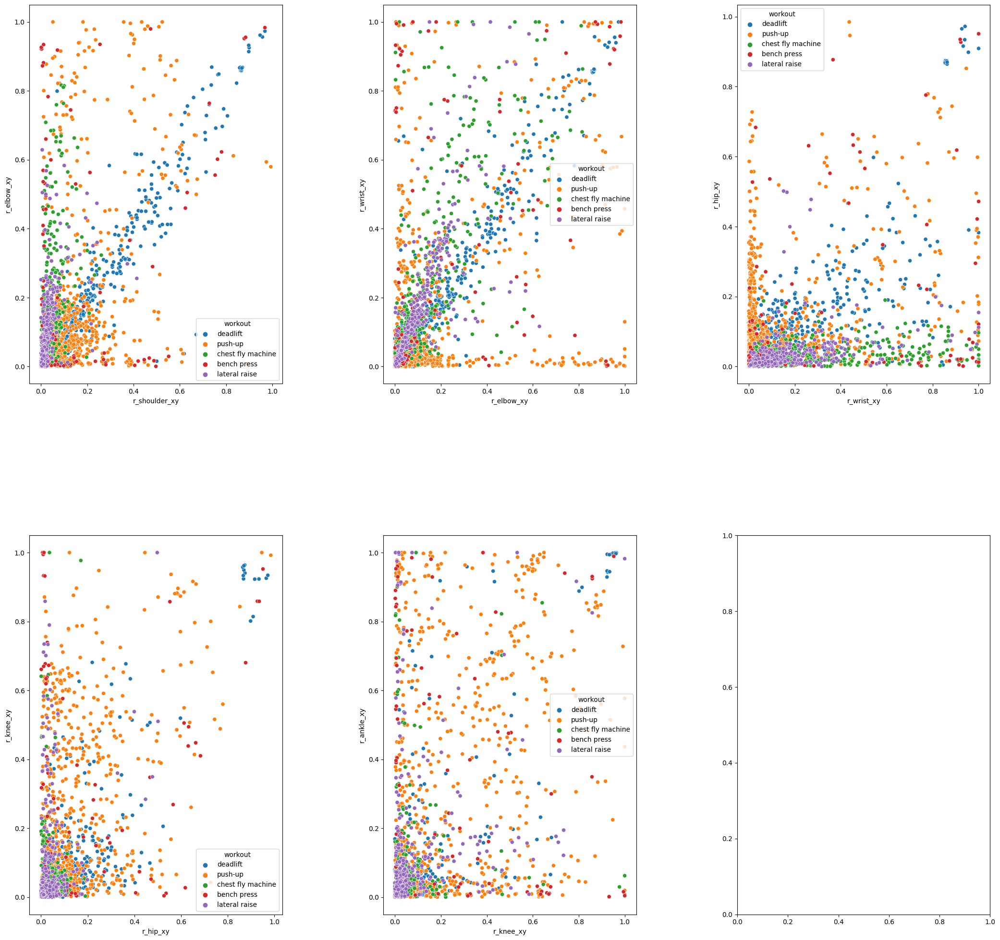

In [109]:
rcols = ['r_shoulder_xy',  'r_elbow_xy', 'r_wrist_xy', 'r_hip_xy', 'r_knee_xy', 'r_ankle_xy']
i=1
plt.figure(figsize=(10,10))
for idx,x in enumerate(rcols):
    plt.subplot(3,3,i)
    if(idx == len(lcols)-1):
        continue
    sns.scatterplot(x=X[x],y=X[rcols[idx+1]],hue=X['workout'])
    plt.subplots_adjust(left=0.0,bottom=0.0,right=2.0,top=3.0,wspace=0.4,hspace=0.4)
    i = i+1


# Line plot of different joints within a workout 

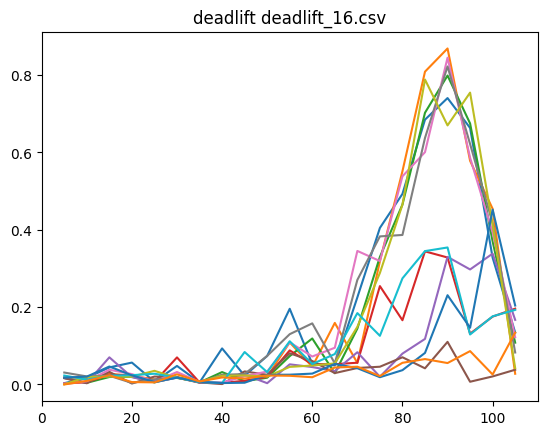

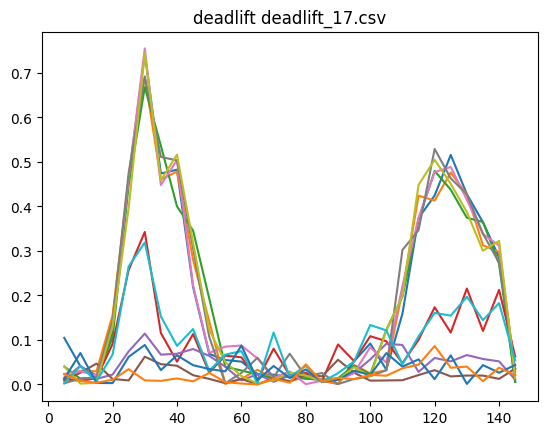

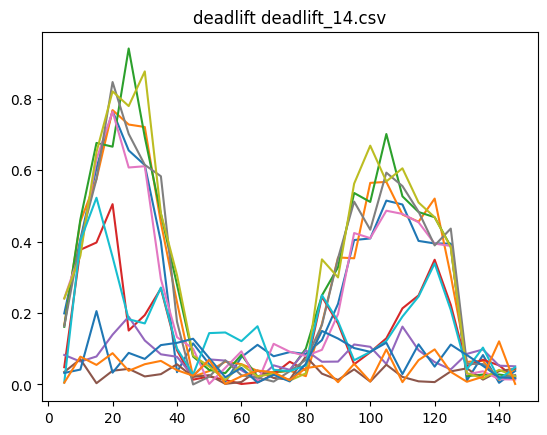

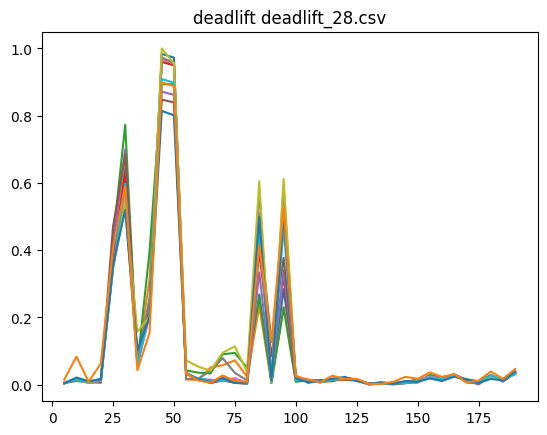

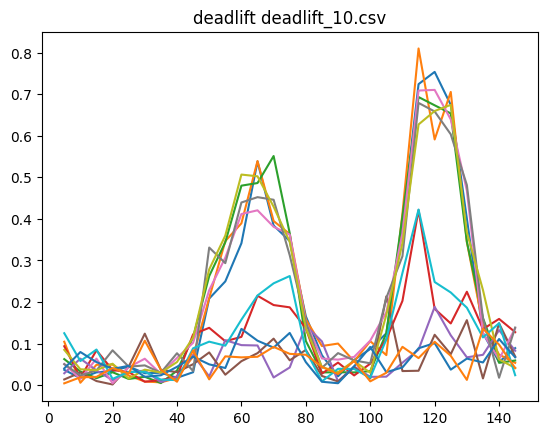

...

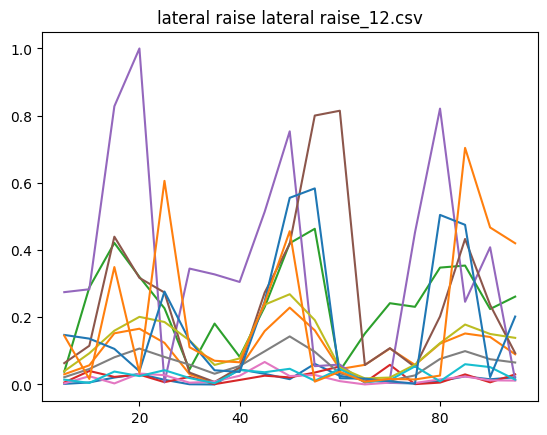

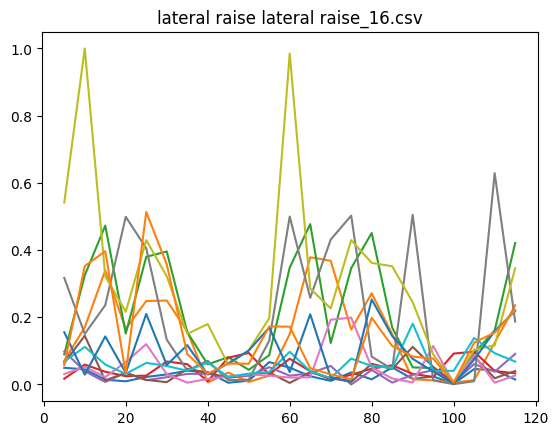

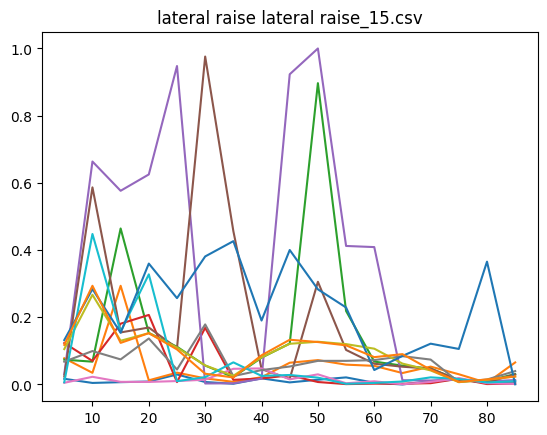

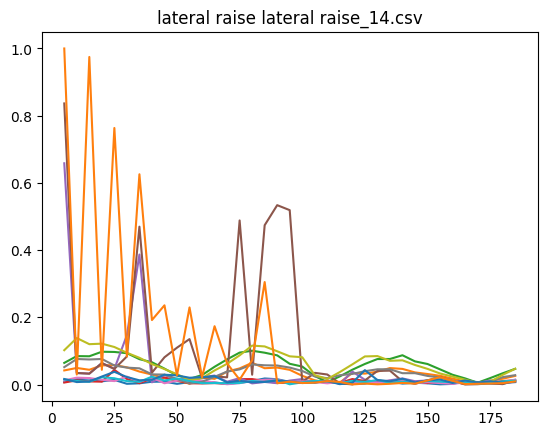

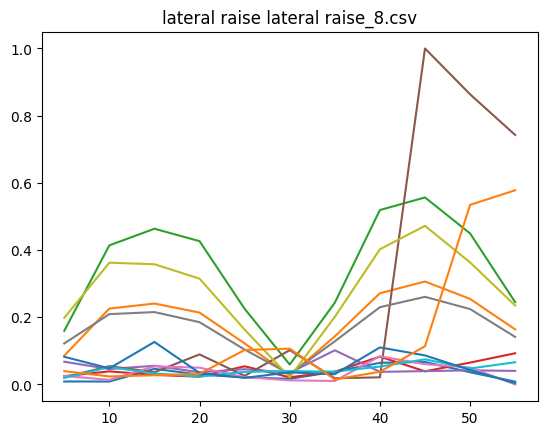

In [110]:
workouts = X['workout'].unique()
for work in workouts:
    filenames = X[X['workout'] == work]['filename'].unique()
    for file in filenames:
        plt.plot(X[(X['workout'] == work) & (X['filename'] == file)].select_dtypes('number')[lcols+rcols])
        plt.title(work + ' ' + file)
        plt.show()